#Import the libraries


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab.patches import cv2_imshow
import zipfile
import tensorflow as tf
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, BatchNormalization

#Dataset
The dataset used here can be downloaded from https://drive.google.com/drive/folders/1xIocFeS4lh-okoZK4V9cD45byViwi8MR?usp=sharing

#Mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os


['bike',
 'boat',
 'bus',
 'car',
 'cycle',
 'helicopter',
 'plane',
 'scooty',
 'truck']

#Rename images
This process is important because we need the paths of every image while preprocessing, so if two images have same names, they will have same paths and this will create an error. 

In [ ]:
import shutil


# os.getcwd()

list_item = os.listdir("/content/drive/MyDrive/Dataset/vechicles/train")

base_path = "./drive/MyDrive/Dataset/vechicles/train/"
for item in list_item :
  path=base_path+item

  for filename in os.listdir(path):
    os.renames(path + '/' + filename, path +'/'+item+'_' + filename) #here we rename the images as there are duplicate names for images in different folders
                                                                     ## to rename the image, we add the name of its class after its name.
                                                                     ### eg. if 'car' class has q1.jpg , it has been renamed to q1_car.jpg

#Merge folders
Here we combine all the images in every single class into one folder.

In [ ]:
def make_new_folder(folder_name, parent_folder):
	
	# Path
	path = os.path.join(parent_folder, folder_name)
	
	# Create the folder
	# 'new_folder' in
	# parent_folder
	try:
		# mode of the folder
		mode = 0o777

		# Create folder
		os.mkdir(path, mode)
	except OSError as error:
		print(error)

# current folder path
current_folder = os.getcwd()

# list of folders to be merged
list_dir = ['drive/MyDrive/Dataset/vechicles/train/bike', 'drive/MyDrive/Dataset/vechicles/train/boat', 'drive/MyDrive/Dataset/vechicles/train/bus', 'drive/MyDrive/Dataset/vechicles/train/car', 'drive/MyDrive/Dataset/vechicles/train/cycle', 'drive/MyDrive/Dataset/vechicles/train/helicopter', 'drive/MyDrive/Dataset/vechicles/train/plane', 'drive/MyDrive/Dataset/vechicles/train/scooty', 'drive/MyDrive/Dataset/vechicles/train/truck']
list_item = ['bike', 'boat', 'bus', 'car', 'cycle', 'helicopter', 'plane', 'scooty', 'truck']

# enumerate on list_dir to get the
# content of all the folders ans store
# it in a dictionary
content_list = {}
for index, val in enumerate(list_dir):
	path = os.path.join(current_folder, val)
	content_list[ list_dir[index] ] = os.listdir(path)

# folder in which all the content will
# be merged
merge_folder = "merge_folder"

# merge_folder path - current_folder
# + merge_folder
merge_folder_path = os.path.join(current_folder, merge_folder)

# create merge_folder if not exists
make_new_folder(merge_folder, current_folder)

# loop through the list of folders
for sub_dir in content_list:

	# loop through the contents of the
	# list of folders
	for contents in content_list[sub_dir]:
		# make the path of the content to move
		path_to_content = sub_dir + "/" + contents

		# make the path with the current folder
		dir_to_move = os.path.join(current_folder, path_to_content )

		# move the file
		shutil.move(dir_to_move, merge_folder_path)

[Errno 17] File exists: '/content/merge_folder'


In [ ]:
os.listdir(path)

[]

In [ ]:
path = "/content/merge_folder"
items = os.listdir(path)

In [ ]:
items

#Get file names 
...by combining the path of merge folder with the name of each image.

In [ ]:
filenames = []
for i in range (0, len(items)):
  path = "/content/merge_folder/" + items[i]
  filenames.append(path)

In [ ]:
filenames

['/content/merge_folder/cycle_images (8).jpg',
 '/content/merge_folder/truck_2Q__ (1).jpg',
 '/content/merge_folder/cycle_9k_ (5).jpg',
 '/content/merge_folder/bike_images (6).jpg',
 '/content/merge_folder/truck_images (17).jpg',
 '/content/merge_folder/cycle_images (14).jpg',
 '/content/merge_folder/plane_2Q__ (9).jpg',
 '/content/merge_folder/scooty_2Q__ (4).jpg',
 '/content/merge_folder/car_images (20).jpg',
 '/content/merge_folder/truck_2Q__ (9).jpg',
 '/content/merge_folder/bike_2Q__ (3).jpg',
 '/content/merge_folder/scooty_images (25).jpg',
 '/content/merge_folder/truck_images (2).jpg',
 '/content/merge_folder/car_2Q__ (1).jpg',
 '/content/merge_folder/bus_2Q__ (10).jpg',
 '/content/merge_folder/truck_9k_ (10).jpg',
 '/content/merge_folder/helicopter_9k_ (1).jpg',
 '/content/merge_folder/car_images (17).jpg',
 '/content/merge_folder/bike_images (21).jpg',
 '/content/merge_folder/truck_9k_.jpg',
 '/content/merge_folder/scooty_2Q__ (1).jpg',
 '/content/merge_folder/plane_images (12

In [ ]:
len(filenames)

468

In [ ]:
len(items)

468

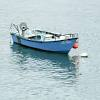

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
image = cv2.imread(filenames[32])
cv2_imshow(image)

#Image preprocessing
Here we resize and rescale the image to make it suitable to be given as input to the neural network.

In [ ]:
IMG_SIZE = 28

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=1)
  # Convert the colour channel values from 0-225 values to 0-1 values
  # Resize the image to our desired size (28, 28)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
tensors = []
for path in filenames:
  tensors.append(process_image(path))
img = np.array(tensors)
img = img.astype('float32')
img = (img - 127.5) / 127.5

In [ ]:
BUFFER_SIZE = 468
BATCH_SIZE = 16

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices(img).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

In [ ]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

#Make generator and discriminator models

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(7*7*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((7, 7, 256)))
    assert model.output_shape == (None, 7, 7, 256)  # Note: None is the batch size

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    assert model.output_shape == (None, 7, 7, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 14, 14, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 28, 28, 1)

    return model

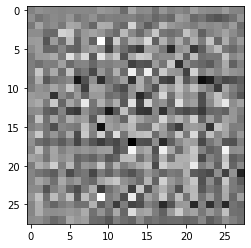

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0], cmap='gray')

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[28, 28, 1]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00046671]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [ ]:
EPOCHS = 200
noise_dim = 100
num_examples_to_generate = 16

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
img[0].shape

(28, 28, 1)

#Train the neural network

In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as you go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 15 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

Generate random noise

In [ ]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(4, 4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

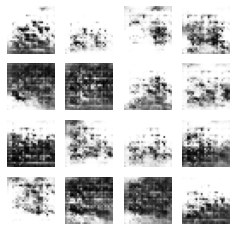

In [ ]:
train(train_dataset, EPOCHS)

View gif

In [ ]:
anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-2xpe25nu
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-2xpe25nu
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=179891 sha256=5d315e6818e1c95635e9f29c51151884e298ad37ff76738c15a554c445a1f98b
  Stored in directory: /tmp/pip-ephem-wheel-cache-tzbfccwv/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs



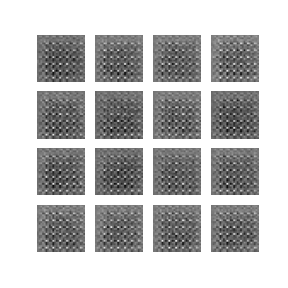

In [ ]:
!pip install git+https://github.com/tensorflow/docs
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)
